# Normal BM (HCA) vs E/R NK (T) cell comparison

In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
%matplotlib inline

import anndata as ad
import scanpy as sc
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
from matplotlib.colors import ListedColormap
import seaborn as sb
import scvelo as scv
import re

import rpy2.rinterface_lib.callbacks
import logging

from rpy2.robjects import pandas2ri
import anndata2ri

/work/juha/miniconda3/envs/sc-tutorial/lib/python3.7/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


In [2]:
sc.logging.print_versions()

scanpy==1.4.5.dev130+g0612475 anndata==0.6.22.post1+1.g8dcc3cd umap==0.3.9 numpy==1.18.1 scipy==1.3.0 pandas==0.24.2 scikit-learn==0.21.2 statsmodels==0.10.0 python-igraph==0.7.1 louvain==0.6.1


In [3]:
# Ignore R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)

# Automatically convert rpy2 outputs to pandas dataframes
pandas2ri.activate()
anndata2ri.activate()
%load_ext rpy2.ipython

plt.rcParams['figure.figsize']=(8,8) #rescale figures
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=60, dpi_save=160, vector_friendly=True)

In [4]:
%%R
# Load all the R libraries we will be using in the notebook
library(scran)

In [5]:
# Custom colors
def hex_to_RGB(hex):
    ''' "#FFFFFF" -> [255,255,255] '''
    # Pass 16 to the integer function for change of base
    return [int(hex[i:i+2], 16) for i in range(1,6,2)]

def create_cmap(low, high, N=256):
    vals = np.ones((N, 4))
    low = hex_to_RGB(low)
    high = hex_to_RGB(high)
    vals[:,0] = np.linspace(low[0]/256, high[0]/256, N)
    vals[:,1] = np.linspace(low[1]/256, high[1]/256, N)
    vals[:,2] = np.linspace(low[2]/256, high[2]/256, N)
    newcmp = ListedColormap(vals)
    return newcmp

cmap_gexp = create_cmap('#D3D3D3', '#A30059') # For individual gene plotting

In [6]:
results_file = '/research/groups/allseq/data/scRNAseq/results/juha_wrk/ALL_scanpy/NK_cell_comparison_clean.h5ad'

<a id="1"></a>

# 1. Read data

In [7]:
ALL = sc.read('/research/groups/allseq/data/scRNAseq/results/juha_wrk/ALL_scanpy/new_2019_ver5/subset/ALL_subset.h5ad')
ALL = ad.AnnData(X=ALL.raw.X, var=ALL.raw.var, obs=ALL.obs)
HCA = sc.read('/research/groups/biowhat_share/public_data/scRNAseq/Human_Cell_Atlas_Preview_Datasets/scanpy/hg19/new_2019/cellranger3/HCA.h5ad')
HCA = ad.AnnData(X=HCA.raw.X, var=HCA.raw.var, obs=HCA.obs)

In [8]:
ALL.obs.celltype.value_counts()

leukemic              24638
CD4+ T                 4766
erythoid precursor     3728
CD8+ T                 3671
immature B             3174
NK                      485
Monocyte                475
CD34+ precursor         180
Plasma B cell            63
Name: celltype, dtype: int64

In [9]:
HCA.obs.celltype.value_counts()

CD14+ monocyte 2               23340
CD4+ T 1                       19070
CD14+ monocyte 1               15810
NK                             15515
NK T 1                         11221
NK T 2                          9727
Late erythoid precursor 1       8929
Immature B                      7922
CD8+ T                          7104
Promonocyte                     6747
Pre B                           6443
HSC                             4489
Conventional dendritic cell     4267
CD4+ T 2                        4021
CD16+ monocyte                  3950
Pro B                           3346
Late erythoid precursor 2       3293
Early erythoid precursor        3208
Plasma B cell                   2947
Plasmacytoid dendritic cell     2943
Pre B (cycling)                 1951
CD4+ T 3                        1472
Late erythoid precursor 3       1034
Megakaryocyte                    754
Stromal cell like                305
Stromal cell                     289
Name: celltype, dtype: int64

### First let's subset all NK/T cells and from there identify NK (T) cells

In [10]:
ALL = ALL[ALL.obs.celltype.isin(['CD4+ T', 'CD8+ T', 'NK'])]
HCA = HCA[HCA.obs.celltype.isin(['CD4+ T 1', 'CD4+ T 2', 'CD4+ T 3', 'CD8+ T', 'NK T 1', 'NK T 2', 'NK'])]

In [11]:
adata = HCA.concatenate(ALL, batch_categories=['HCA', 'ALL'], index_unique=None)

In [12]:
adata

AnnData object with n_obs × n_vars = 77052 × 32738 
    obs: 'G2M_score', 'S_score', 'batch', 'celltype', 'celltype_labelTransfer', 'celltype_old', 'celltype_short', 'chen_pnone0162638_CLP', 'chen_pnone0162638_immature_B', 'chen_pnone0162638_pre-B', 'chen_pnone0162638_pro-B', 'in_previous_dataset', 'louvain', 'louvain_1.0', 'louvain_1.1', 'louvain_1.2', 'louvain_1.3', 'louvain_1.4', 'louvain_1.5', 'louvain_1.6', 'louvain_1.7', 'louvain_1.8', 'louvain_1.9', 'louvain_2.0', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'phase'

In [13]:
dataset = adata.obs.batch
sample = [re.sub('.*-|.*_', '', x) for x in adata.obs_names]
celltype_old = adata.obs.celltype

In [14]:
for i in adata.obs.columns:
    del adata.obs[i]

In [15]:
adata.obs['dataset'] = dataset
adata.obs['sample'] = sample
adata.obs['celltype_old'] = celltype_old

In [16]:
adata.obs.head()

,dataset,sample,celltype_old
index,,,
MantonBM1_HiSeq_1-AAACCTGCATTCCTGC-1-MantonBM1,HCA,MantonBM1,NK
MantonBM1_HiSeq_1-AAACCTGTCACCTCGT-1-MantonBM1,HCA,MantonBM1,NK
MantonBM1_HiSeq_1-AAACCTGTCTACTCAT-1-MantonBM1,HCA,MantonBM1,CD8+ T
MantonBM1_HiSeq_1-AAACGGGTCAGGTAAA-1-MantonBM1,HCA,MantonBM1,CD4+ T 1
MantonBM1_HiSeq_1-AAACGGGTCATCGATG-1-MantonBM1,HCA,MantonBM1,NK T 2


<a id="2"></a>

# 2. QC

In [17]:
# Prelim soft filter
sc.pp.filter_cells(adata, min_genes=1)
sc.pp.filter_genes(adata, min_cells=100)

filtered out 19837 genes that are detected in less than 100 cells


In [18]:
mito_genes = [name for name in adata.var_names if name.startswith('MT-')]
adata.obs['percent_mito'] = np.sum(adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
ribo_genes = [name for name in adata.var_names if name.startswith('RP')]
adata.obs['percent_ribo'] = np.sum(adata[:, ribo_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
adata.obs['n_counts'] = adata.X.sum(axis=1).A1

... storing 'sample' as categorical
... storing 'celltype_old' as categorical


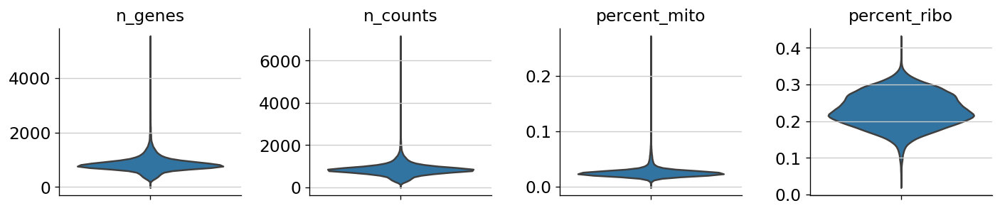

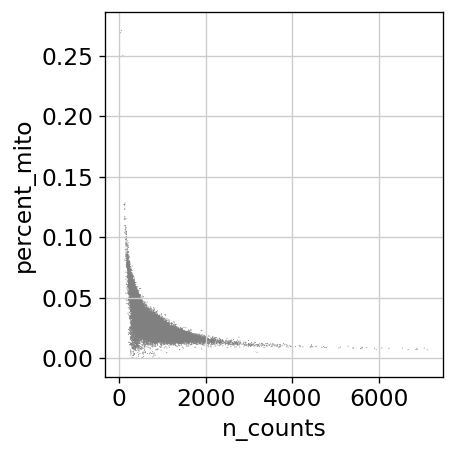

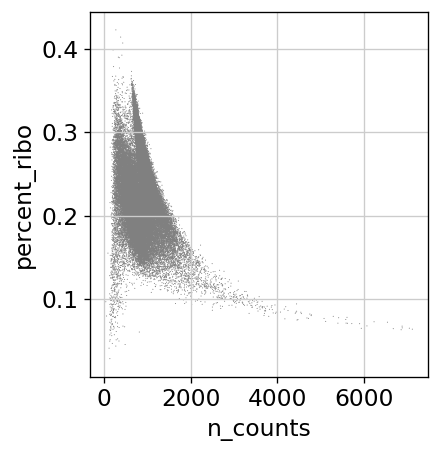

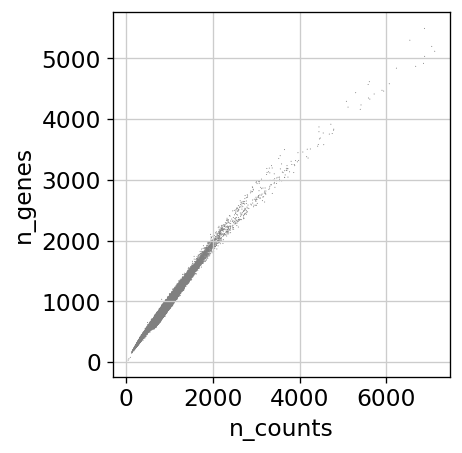

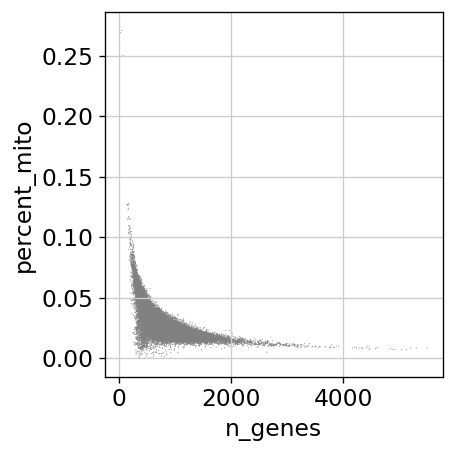

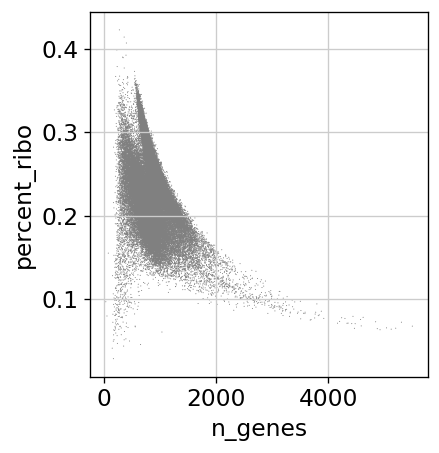

In [19]:
sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo'], stripplot=False, multi_panel=True)
sc.pl.scatter(adata, x='n_counts', y='percent_mito')
sc.pl.scatter(adata, x='n_counts', y='percent_ribo')
sc.pl.scatter(adata, x='n_counts', y='n_genes')
sc.pl.scatter(adata, x='n_genes', y='percent_mito')
sc.pl.scatter(adata, x='n_genes', y='percent_ribo')

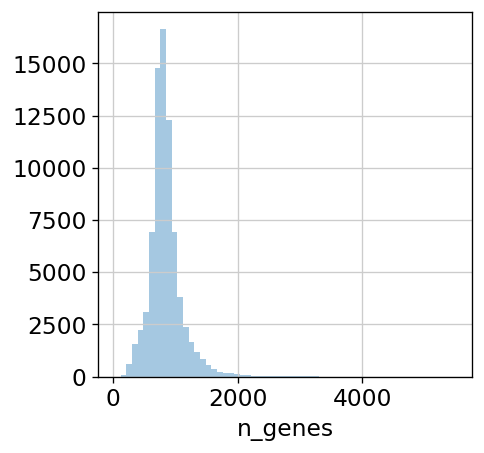

In [20]:
sb.distplot(adata.obs['n_genes'], kde=False, bins=60)

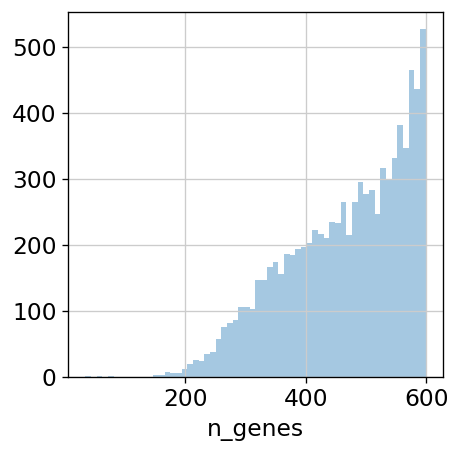

In [21]:
sb.distplot(adata.obs['n_genes'][adata.obs['n_genes']<600], kde=False, bins=60)

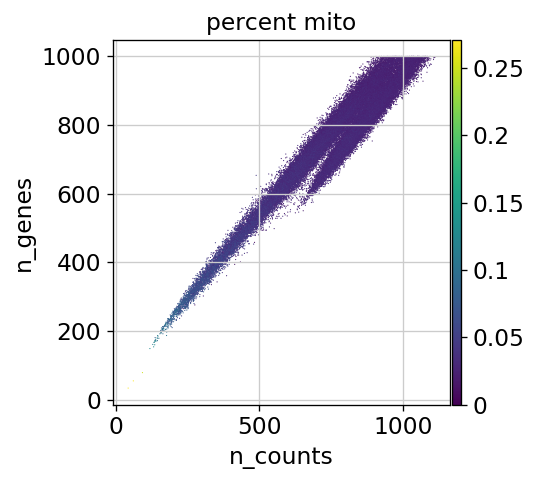

In [22]:
sc.pl.scatter(adata[adata.obs['n_genes']<1000], x='n_counts', y='n_genes', color='percent_mito')

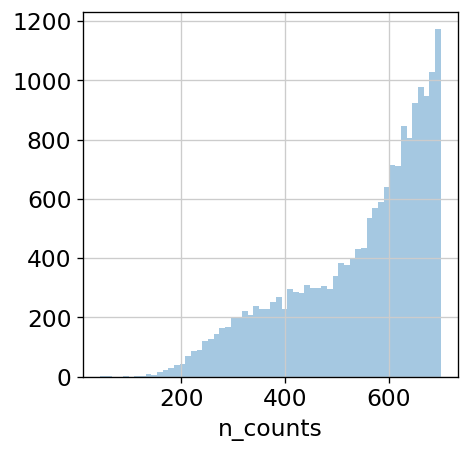

In [23]:
sb.distplot(adata.obs['n_counts'][adata.obs['n_counts']<700], kde=False, bins=60)

In [24]:
print('Cells before filtering: {0}'.format(adata.shape[0]))
adata = adata[adata.obs['percent_mito'] < 0.05]
adata = adata[adata.obs['n_counts'] < 3000]
adata = adata[adata.obs['n_genes'] < 3000]
adata = adata[adata.obs['n_genes'] > 200]
adata = adata[adata.obs['n_counts'] > 500]
print('Cells after filtering: {0}'.format(adata.shape[0]))

Cells before filtering: 77052
Cells after filtering: 70872


<a id="3"></a>

# 3. Normalize

In [25]:
#Perform a clustering for scran normalization in clusters
adata_pp = adata.copy()
sc.pp.normalize_per_cell(adata_pp, counts_per_cell_after=1e6)
sc.pp.log1p(adata_pp)
sc.pp.pca(adata_pp, n_comps=15)
sc.pp.neighbors(adata_pp)
sc.tl.louvain(adata_pp, key_added='groups', resolution=0.5)

normalizing by total count per cell
    finished (0:00:01): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 15
    finished (0:00:41)
computing neighbors
    using 'X_pca' with n_pcs = 15
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:15)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 11 clusters and added
    'groups', the cluster labels (adata.obs, categorical) (0:00:23)


In [26]:
#Preprocess variables for scran normalization
input_groups = adata_pp.obs['groups']
data_mat = adata.X.T

In [27]:
%%R -i data_mat -i input_groups -o size_factors

size_factors = computeSumFactors(data_mat, clusters=input_groups, min.mean=0.1)

In [28]:
#Delete adata_pp
del adata_pp

Trying to set attribute `.obs` of view, making a copy.


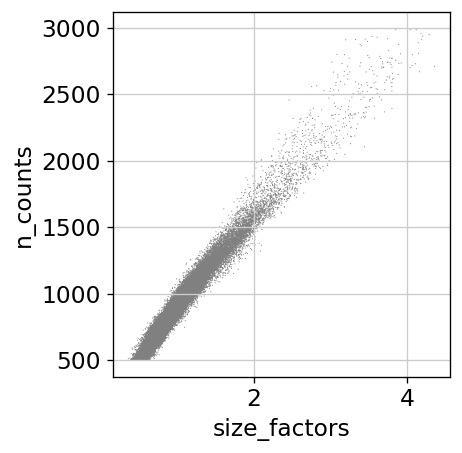

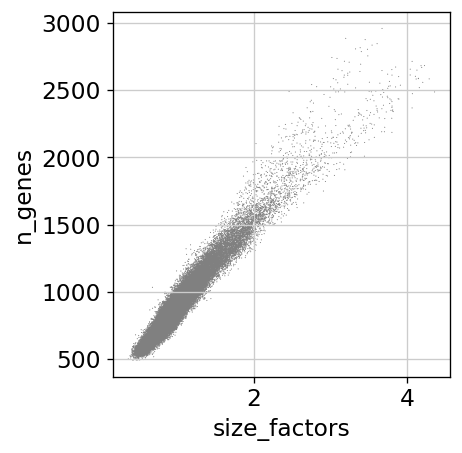

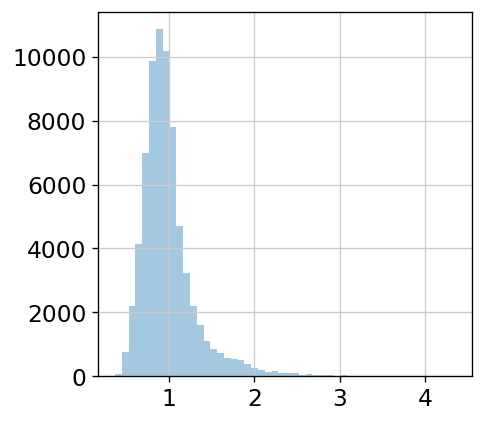

In [29]:
# Visualize the estimated size factors
adata.obs['size_factors'] = size_factors

sc.pl.scatter(adata, 'size_factors', 'n_counts')
sc.pl.scatter(adata, 'size_factors', 'n_genes')

sb.distplot(size_factors, bins=50, kde=False)
plt.show()

In [30]:
#Keep the count data in a counts layer
adata.layers["counts"] = adata.X.copy()

In [31]:
#Normalize adata 
adata.X /= adata.obs['size_factors'].values[:,None]
sc.pp.log1p(adata)
adata.X = sp.sparse.csr_matrix(adata.X)

In [32]:
# Store the full data set in 'raw' as log-normalised data for statistical testing
adata.raw = adata

<a id="4"></a>

# 4. HVG

In [33]:
sc.pp.highly_variable_genes(adata, flavor='cell_ranger', n_top_genes=3000)

extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


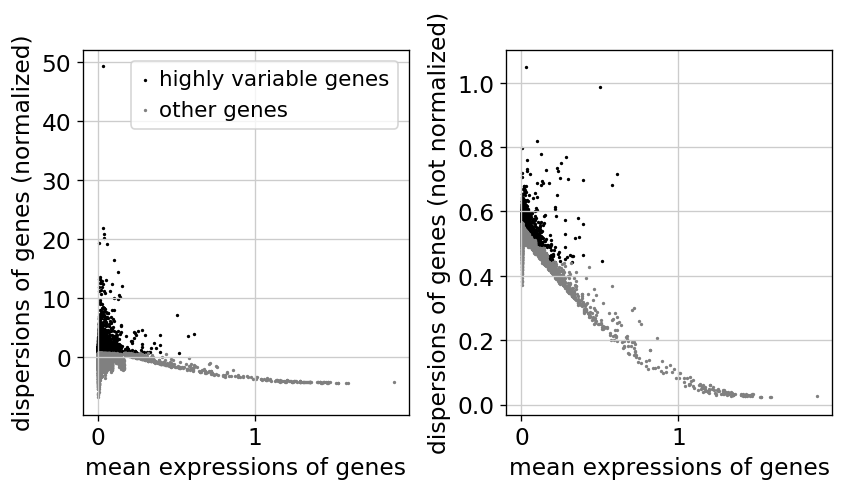

In [34]:
sc.pl.highly_variable_genes(adata)

<a id="5"></a>

# 5. Cell cycle scoring

In [35]:
# Read cell cycle genes
s_genes = pd.read_csv('/research/groups/allseq/data/scRNAseq/results/juha_wrk/resources/regev_lab_cell_cycle_genes_S_phase.txt', header=None)[0]
g2m_genes = pd.read_csv('/research/groups/allseq/data/scRNAseq/results/juha_wrk/resources/regev_lab_cell_cycle_genes_G2M_phase.txt', header=None)[0]

In [36]:
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs) (0:00:36)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs) (0:00:12)
-->     'phase', cell cycle phase (adata.obs)


<a id="6"></a>

# 6. Visualization

In [37]:
sc.pp.pca(adata, n_comps=50, use_highly_variable=True, svd_solver='randomized') # Reproducability issue with svd_solver='arpack'
sc.pp.neighbors(adata, n_neighbors=15)

sc.tl.umap(adata)
sc.tl.diffmap(adata)

Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 50
computing PCA on highly variable genes
    finished (0:00:07)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:22)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:27)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.99634373 0.9837902  0.9820391  0.9682023  0.9656259
     0.95791185 0.9555156  0.94636595 0.94231445 0.9397197  0.9342253
     0.9299086  0.9156552  0.9118597 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.ob

... storing 'phase' as categorical


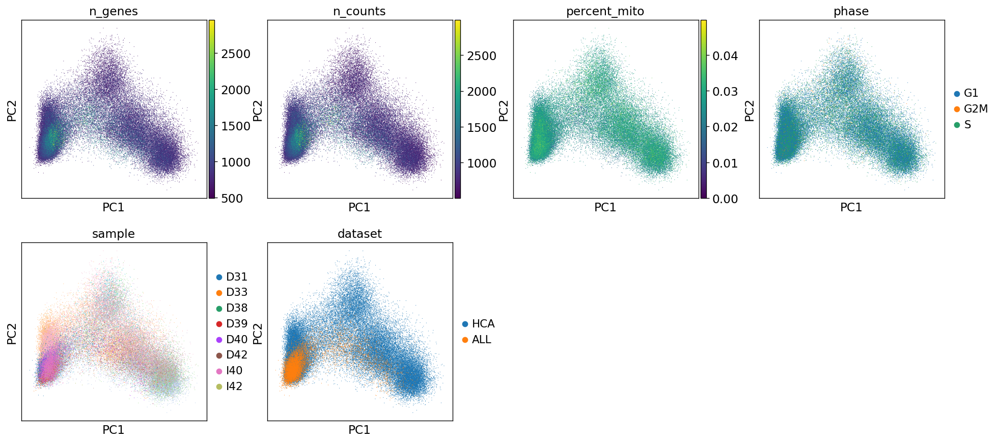

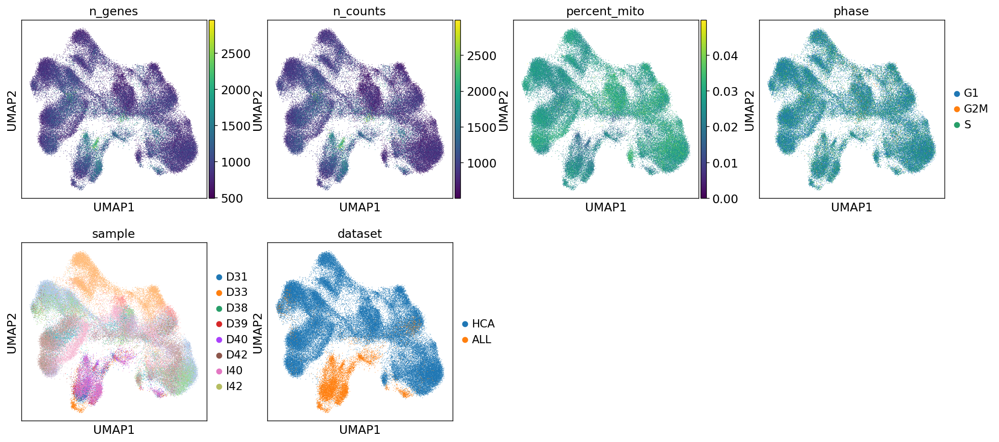

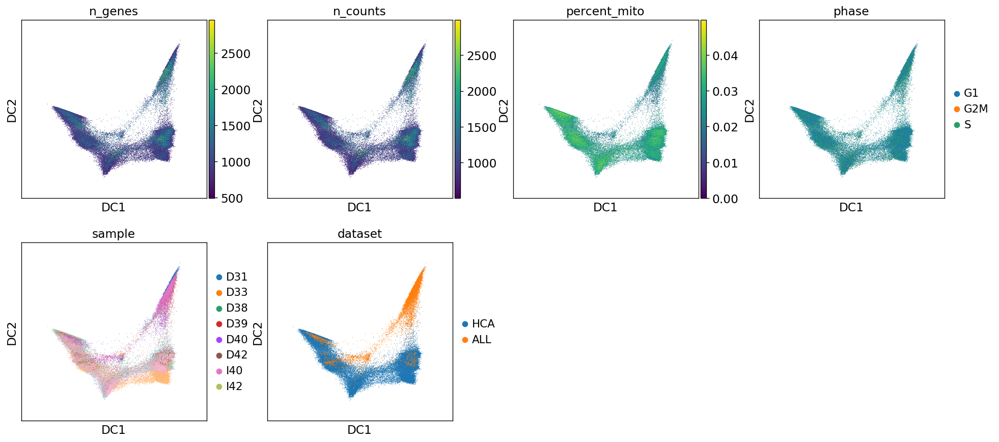

In [38]:
sc.pl.pca_scatter(adata, color=['n_genes', 'n_counts', 'percent_mito', 'phase', 'sample', 'dataset'])
sc.pl.umap(adata, color=['n_genes', 'n_counts', 'percent_mito', 'phase', 'sample', 'dataset'])
sc.pl.diffmap(adata, color=['n_genes', 'n_counts', 'percent_mito', 'phase', 'sample', 'dataset'])

<a id="7"></a>

# 7. Clustering

In [39]:
# Perform clustering - using highly variable genes
sc.tl.louvain(adata, resolution=1.5, key_added='louvain')
sc.tl.louvain(adata, resolution=1.0, key_added='louvain_r1')
sc.tl.leiden(adata, resolution=1.5, key_added='leiden')
sc.tl.leiden(adata, resolution=1.0, key_added='leiden_r1')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 17 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:11)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 12 clusters and added
    'louvain_r1', the cluster labels (adata.obs, categorical) (0:00:13)
running Leiden clustering
    finished: found 17 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:50)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden_r1', the cluster labels (adata.obs, categorical) (0:00:31)


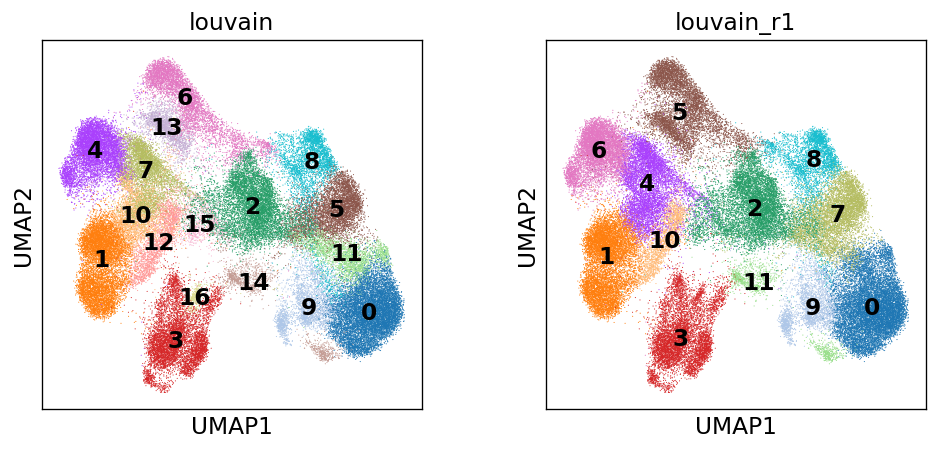

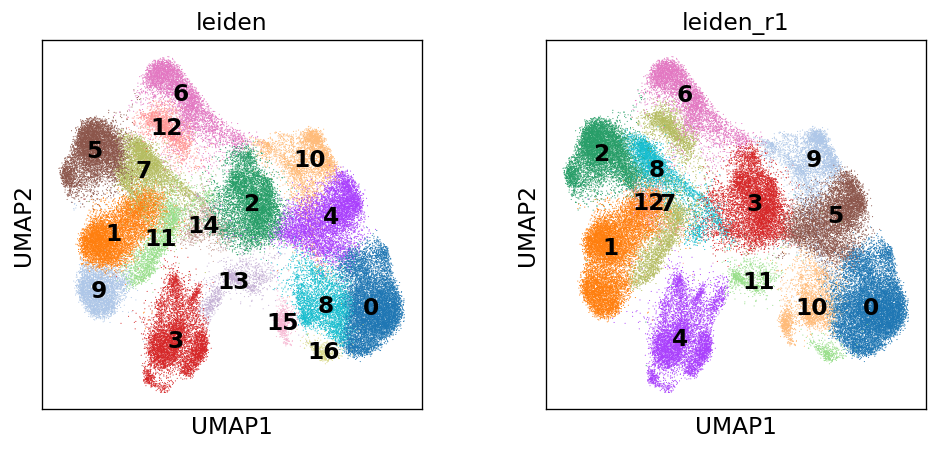

In [40]:
# Visualize the clustering
sc.pl.umap(adata, color=['louvain', 'louvain_r1'], legend_loc='on data')
sc.pl.umap(adata, color=['leiden', 'leiden_r1'], legend_loc='on data')

<a id="8"></a>

# 8. DE genes

In [41]:
sc.tl.rank_genes_groups(adata, groupby='leiden', use_raw=False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:39)


In [42]:
marker_genes = pd.Series()
for i in adata.obs.leiden_r1.cat.categories:
    marker_genes = marker_genes.append(sc.get.rank_genes_groups_df(adata, group=i, pval_cutoff=1e-4, log2fc_min=2)['names'][:5])
marker_genes = marker_genes.unique()

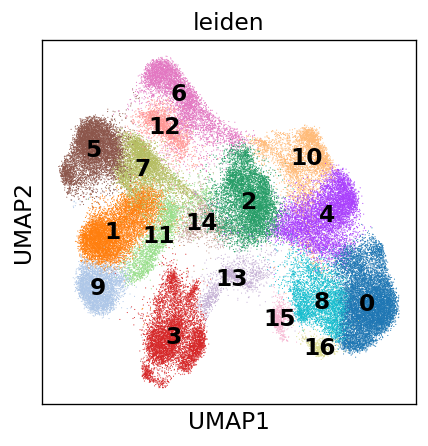

In [43]:
sc.pl.umap(adata, color='leiden', legend_loc='on data')

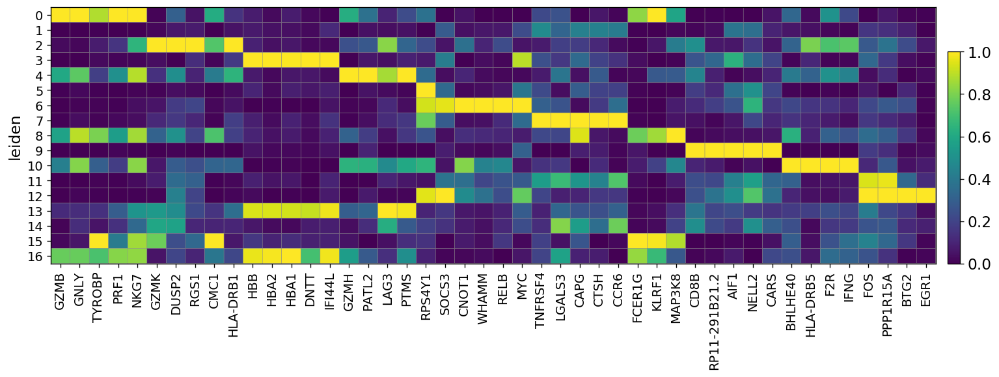

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[14.72, 0, 0.2])

In [44]:
sc.pl.matrixplot(adata, var_names=marker_genes, groupby='leiden', standard_scale='var')

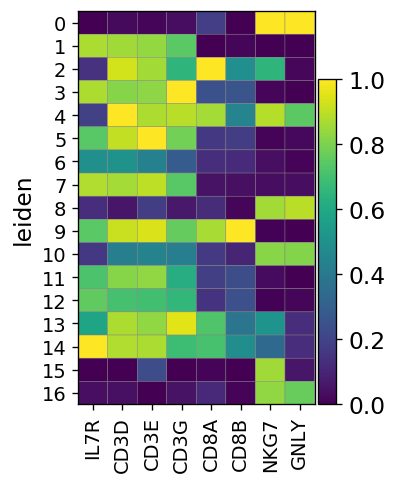

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[2.56, 0, 0.2])

In [45]:
sc.pl.matrixplot(adata, var_names=['IL7R', 'CD3D', 'CD3E', 'CD3G', 'CD8A', 'CD8B', 'NKG7', 'GNLY'], groupby='leiden', standard_scale='var')

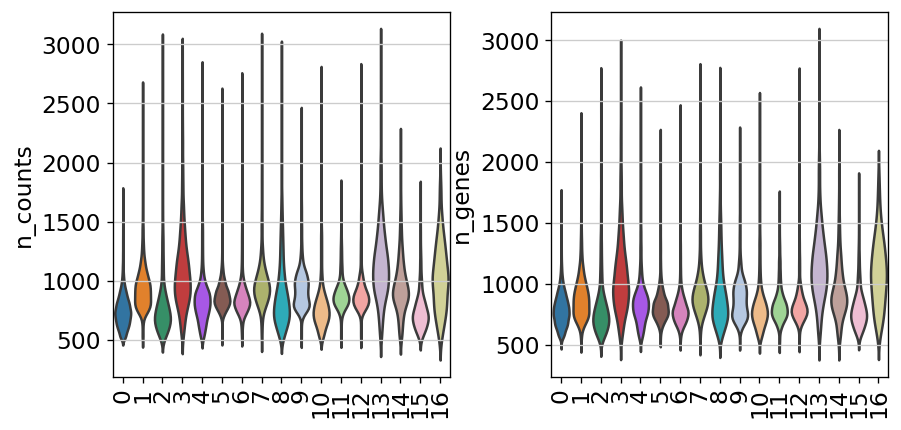

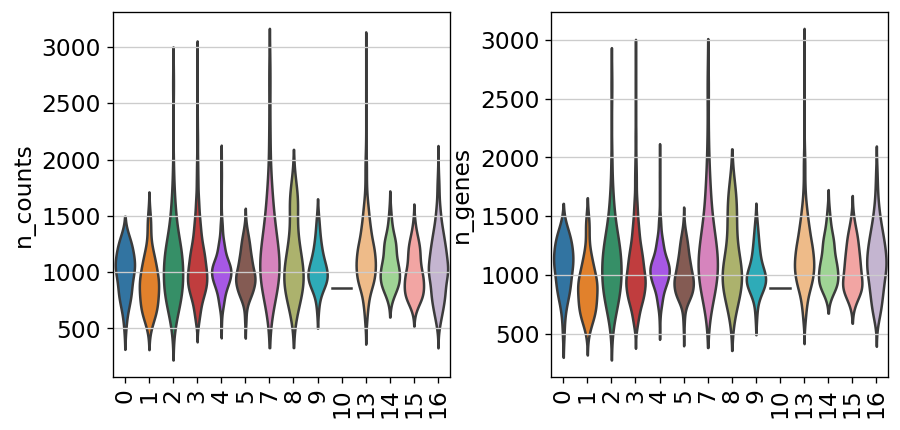

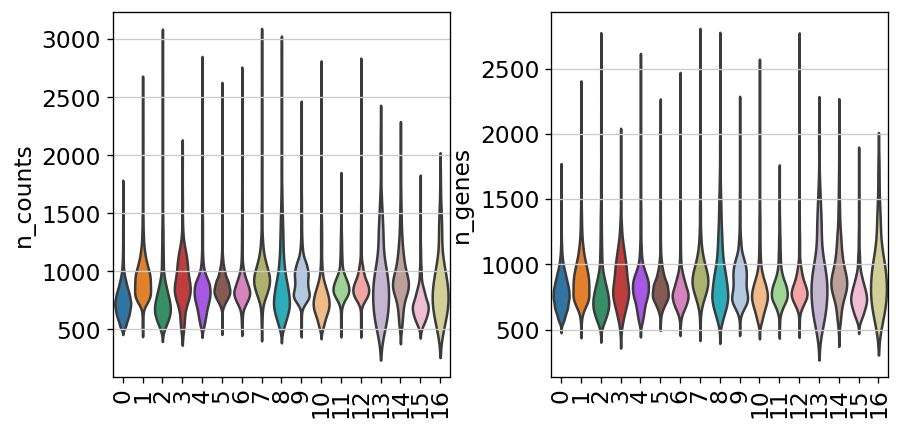

In [46]:
sc.pl.violin(adata, keys=['n_counts', 'n_genes'], groupby='leiden', stripplot=False, rotation=90)
sc.pl.violin(adata[adata.obs.dataset == 'ALL'], keys=['n_counts', 'n_genes'], groupby='leiden', stripplot=False, rotation=90)
sc.pl.violin(adata[adata.obs.dataset == 'HCA'], keys=['n_counts', 'n_genes'], groupby='leiden', stripplot=False, rotation=90)

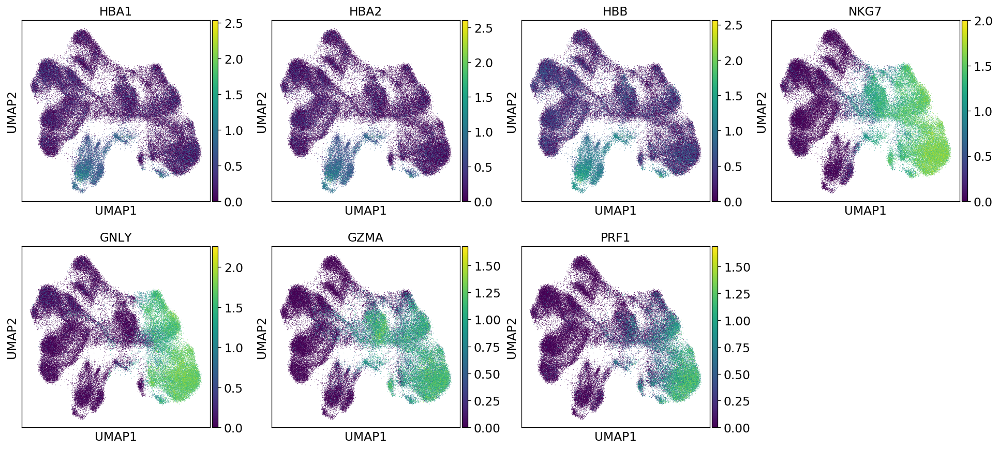

In [47]:
sc.pl.umap(adata, color=['HBA1', 'HBA2', 'HBB', 'NKG7', 'GNLY', 'GZMA', 'PRF1'])

### Subset possible erythroid cells out

In [48]:
adata = adata[~adata.obs['leiden_r1'].isin(['4', '11'])]

In [49]:
sc.pp.highly_variable_genes(adata, flavor='cell_ranger', n_top_genes=3000)

extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


Trying to set attribute `.var` of view, making a copy.


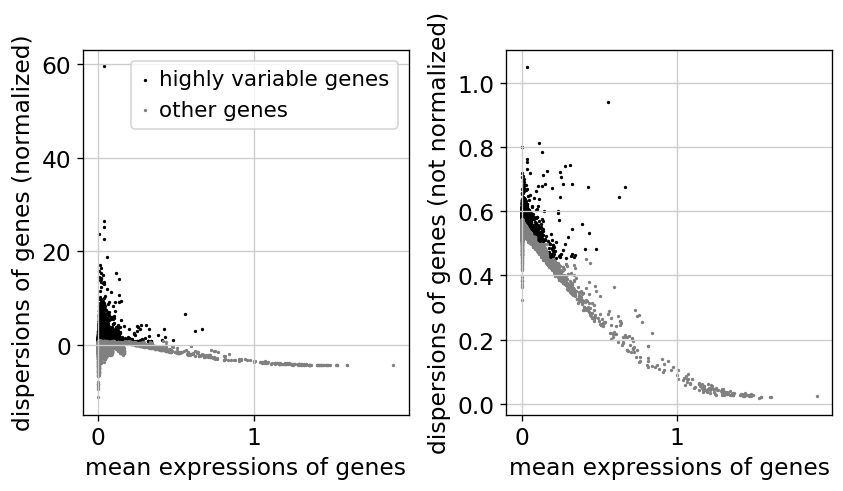

In [50]:
sc.pl.highly_variable_genes(adata)

<a id="5"></a>

# 5. Cell cycle scoring

In [51]:
# Read cell cycle genes
s_genes = pd.read_csv('/research/groups/allseq/data/scRNAseq/results/juha_wrk/resources/regev_lab_cell_cycle_genes_S_phase.txt', header=None)[0]
g2m_genes = pd.read_csv('/research/groups/allseq/data/scRNAseq/results/juha_wrk/resources/regev_lab_cell_cycle_genes_G2M_phase.txt', header=None)[0]

In [52]:
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs) (0:00:07)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs) (0:00:06)
-->     'phase', cell cycle phase (adata.obs)


<a id="6"></a>

# 6. Visualization

In [53]:
sc.pp.pca(adata, n_comps=50, use_highly_variable=True, svd_solver='randomized') # Reproducability issue with svd_solver='arpack'
sc.pp.neighbors(adata, n_neighbors=15)

sc.tl.umap(adata)
sc.tl.diffmap(adata)

Note that scikit-learn's randomized PCA might not be exactly reproducible across different computational platforms. For exact reproducibility, choose `svd_solver='arpack'.` This will likely become the Scanpy default in the future.
computing PCA with n_comps = 50
computing PCA on highly variable genes
    finished (0:00:04)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:19)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:22)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.99644804 0.98333925 0.9692483  0.96835905 0.96160686
     0.9575823  0.94440335 0.94049823 0.9353553  0.9307856  0.91302747
     0.9045699  0.90163726 0.8997647 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.

... storing 'phase' as categorical


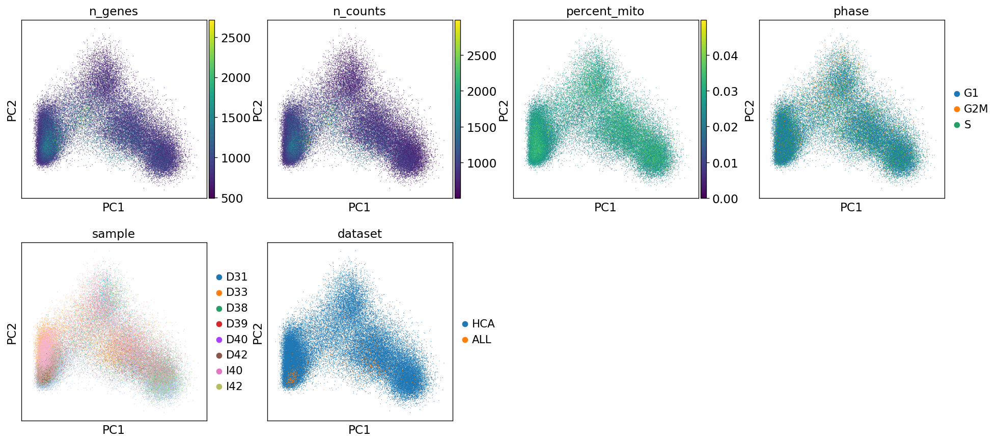

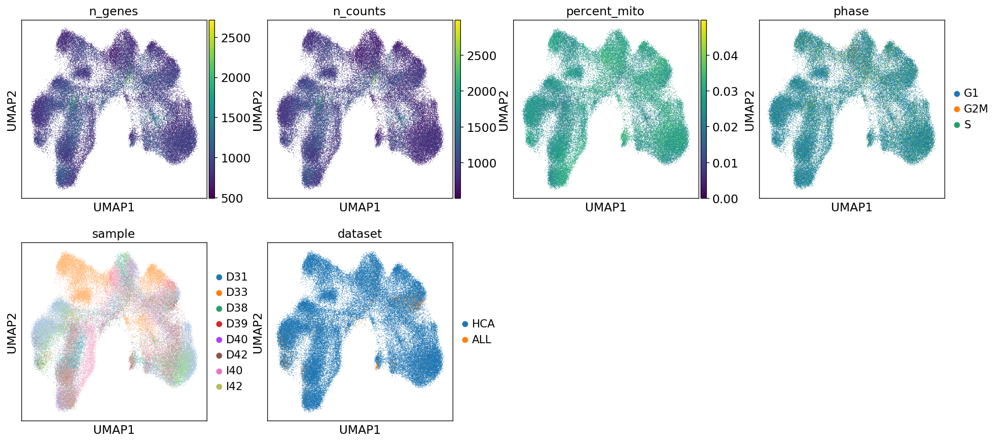

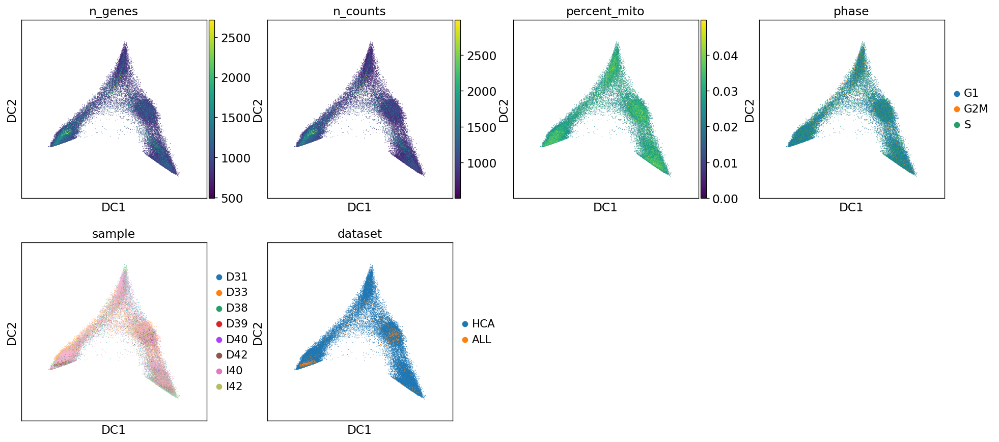

In [54]:
sc.pl.pca_scatter(adata, color=['n_genes', 'n_counts', 'percent_mito', 'phase', 'sample', 'dataset'])
sc.pl.umap(adata, color=['n_genes', 'n_counts', 'percent_mito', 'phase', 'sample', 'dataset'])
sc.pl.diffmap(adata, color=['n_genes', 'n_counts', 'percent_mito', 'phase', 'sample', 'dataset'])

<a id="7"></a>

# 7. Clustering

In [55]:
# Perform clustering - using highly variable genes
sc.tl.louvain(adata, resolution=1.5, key_added='louvain')
sc.tl.louvain(adata, resolution=1.0, key_added='louvain_r1')
sc.tl.leiden(adata, resolution=1.5, key_added='leiden')
sc.tl.leiden(adata, resolution=1.0, key_added='leiden_r1')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 15 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:16)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 11 clusters and added
    'louvain_r1', the cluster labels (adata.obs, categorical) (0:00:12)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:01:18)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden_r1', the cluster labels (adata.obs, categorical) (0:00:28)


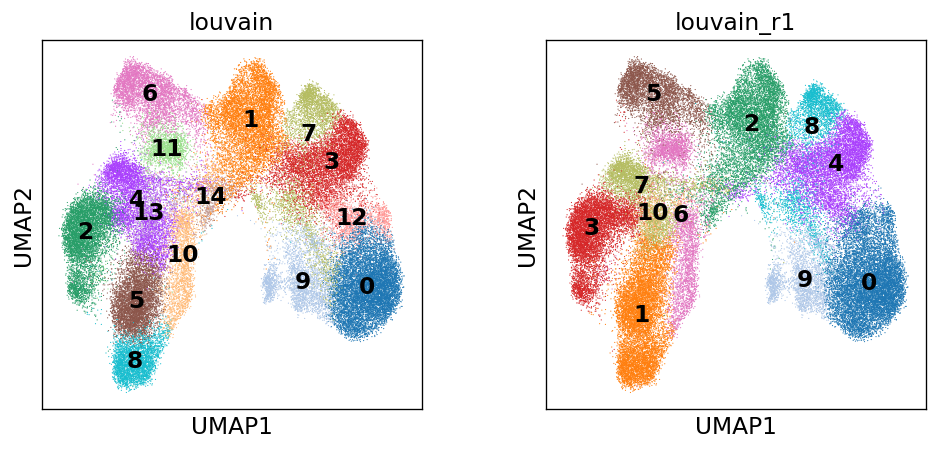

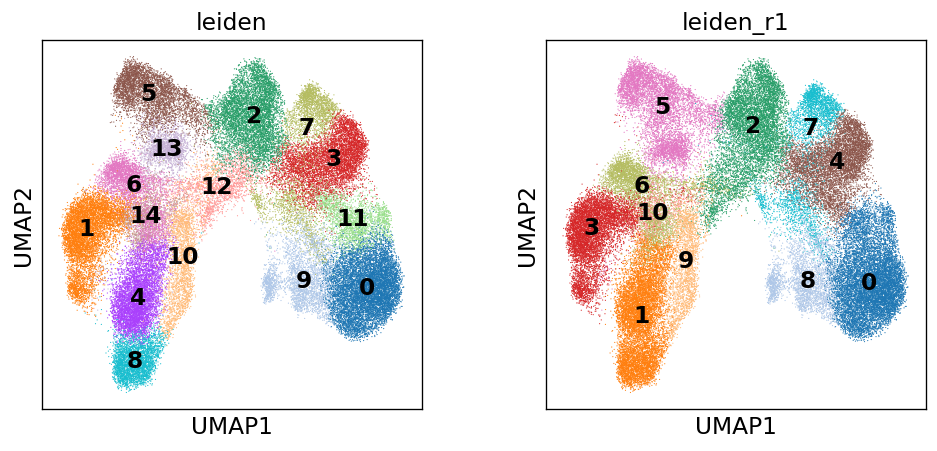

In [56]:
# Visualize the clustering
sc.pl.umap(adata, color=['louvain', 'louvain_r1'], legend_loc='on data')
sc.pl.umap(adata, color=['leiden', 'leiden_r1'], legend_loc='on data')

<a id="8"></a>

# 8. DE genes

In [57]:
sc.tl.rank_genes_groups(adata, groupby='leiden_r1', use_raw=False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:17)


In [58]:
marker_genes = pd.Series()
for i in adata.obs.leiden_r1.cat.categories:
    marker_genes = marker_genes.append(sc.get.rank_genes_groups_df(adata, group=i, pval_cutoff=1e-4, log2fc_min=2)['names'][:5])
marker_genes = marker_genes.unique()

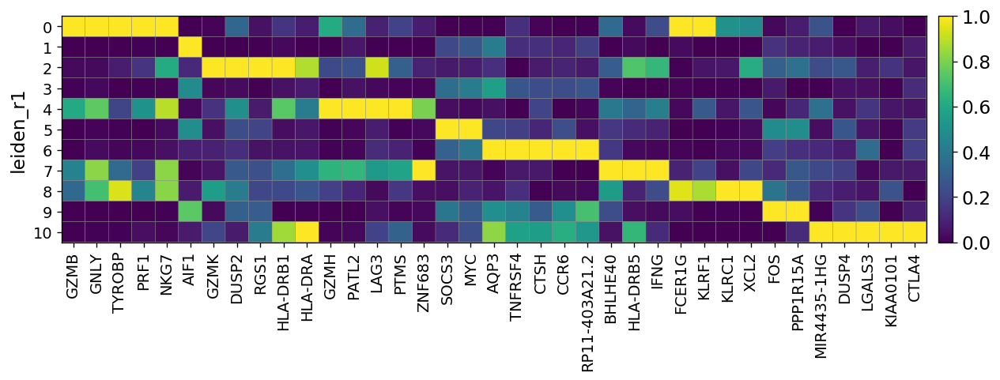

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[11.84, 0, 0.2])

In [60]:
sc.pl.matrixplot(adata, var_names=marker_genes, groupby='leiden_r1', standard_scale='var')

In [61]:
adata.var_names[adata.var_names.str.startswith('CD8')]

Index(['CD84', 'CD8A', 'CD8B', 'CD83', 'CD81', 'CD82'], dtype='object')

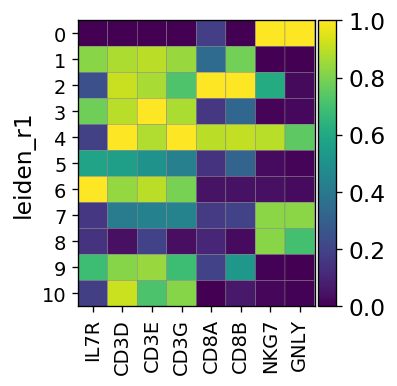

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[2.56, 0, 0.2])

In [62]:
sc.pl.matrixplot(adata, var_names=['IL7R', 'CD3D', 'CD3E', 'CD3G', 'CD8A', 'CD8B', 'NKG7', 'GNLY'], groupby='leiden_r1', standard_scale='var')

In [63]:
pd.crosstab(adata.obs.leiden_r1, adata.obs.dataset)

dataset,HCA,ALL
leiden_r1,,
0,10985,42
1,9207,74
2,7627,102
3,7222,171
4,6259,262
5,6501,0
6,4161,12
7,3556,1
8,3077,88


In [64]:
pd.crosstab(adata[adata.obs.dataset == 'ALL'].obs.leiden_r1, adata[adata.obs.dataset == 'ALL'].obs['sample'])

sample,D31,D33,D38,D39,D40,D42,I40,I42
leiden_r1,,,,,,,,
0,4,3,20,2,0,4,0,9
1,1,0,49,6,7,5,1,5
2,3,2,33,5,4,26,2,27
3,0,4,2,0,0,113,0,52
4,0,0,4,7,2,109,4,136
6,0,1,3,0,0,6,0,2
7,0,0,0,0,0,0,0,1
8,17,16,3,4,13,5,17,13
10,0,0,3,5,1,6,1,0


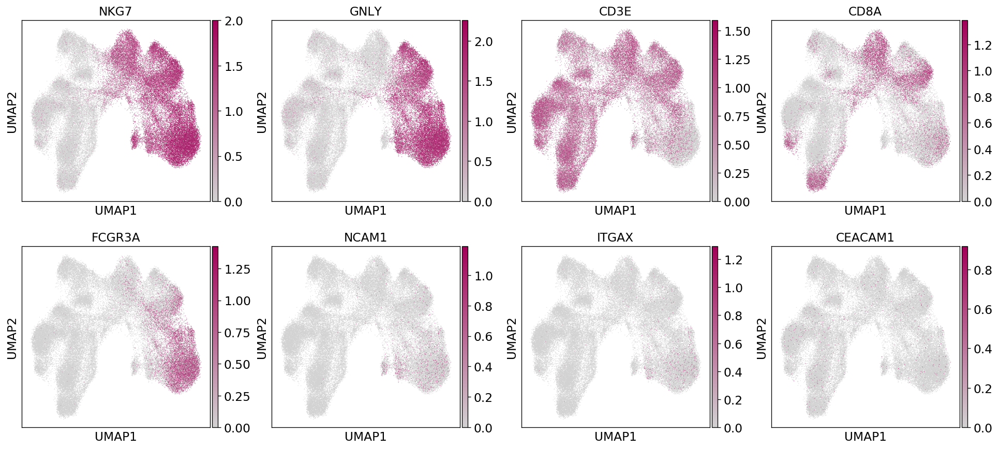

In [65]:
sc.pl.umap(adata, color=['NKG7', 'GNLY', 'CD3E', 'CD8A', 'FCGR3A', 'NCAM1', 'ITGAX', 'CEACAM1'], color_map=cmap_gexp)

<a id="9"></a>

# 9. Check Yang et al. NK data gene sets

In [66]:
yang_genes = pd.read_excel('/research/groups/allseq/data/scRNAseq/results/juha_wrk/resources/41467_2019_11947_MOESM5_ESM.xlsx', index_col=0)

In [67]:
yang_genes_sorted = yang_genes.sort_values(by='avg_logFC', ascending=False)

In [68]:
yang_genes_sorted.head()

,p_val,avg_logFC,pct.1,pct.2,p_val_adj,cluster,gene
IFIT2.4,2.463177e-137,2.197624,0.776,0.104,8.061486e-133,7,IFIT2
IFIT3,4.639383e-147,2.104022,0.706,0.055,1.518377e-142,7,IFIT3
CCL3.5,2.736862e-81,1.996737,0.806,0.345,8.957201e-77,7,CCL3
PMAIP1.4,9.954482e-148,1.886063,0.871,0.424,3.257903e-143,7,PMAIP1
CCL3L1.1,5.054206e-76,1.755867,0.507,0.051,1.654140e-71,7,CCL3L1


### Calculate gene sets scores with Yang top genes

In [69]:
for i in yang_genes_sorted['cluster'].unique():
    gs = yang_genes_sorted[yang_genes_sorted['cluster'] == i]['gene'][:20]
    sc.tl.score_genes(adata, gene_list=gs, score_name='Yang_cluster_' + str(i) + '_score')

computing score 'Yang_cluster_7_score'
    finished: added
    'Yang_cluster_7_score', score of gene set (adata.obs) (0:00:08)
computing score 'Yang_cluster_6_score'
    finished: added
    'Yang_cluster_6_score', score of gene set (adata.obs) (0:00:06)
computing score 'Yang_cluster_1_score'
    finished: added
    'Yang_cluster_1_score', score of gene set (adata.obs) (0:00:06)
computing score 'Yang_cluster_2_score'
    finished: added
    'Yang_cluster_2_score', score of gene set (adata.obs) (0:00:06)
computing score 'Yang_cluster_5_score'
    finished: added
    'Yang_cluster_5_score', score of gene set (adata.obs) (0:00:06)
computing score 'Yang_cluster_3_score'
    finished: added
    'Yang_cluster_3_score', score of gene set (adata.obs) (0:00:06)
computing score 'Yang_cluster_4_score'
    finished: added
    'Yang_cluster_4_score', score of gene set (adata.obs) (0:00:06)


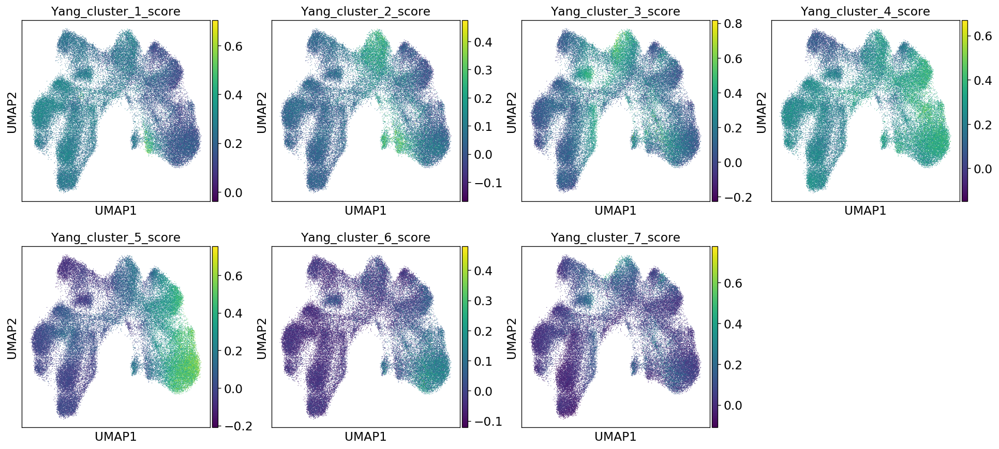

In [71]:
sc.pl.umap(adata, color=['Yang_cluster_' + str(i) + '_score' for i in range(1,8)])

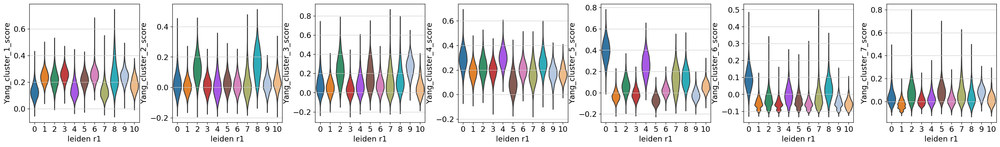

In [72]:
sc.pl.violin(adata, keys=['Yang_cluster_' + str(i) + '_score' for i in range(1,8)], stripplot=False, groupby='leiden_r1')

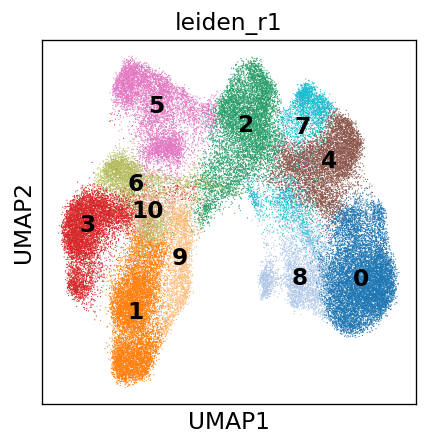

In [73]:
sc.pl.umap(adata, color='leiden_r1', legend_loc='on data')

In [74]:
# Cluster 8 seems to have 2 subclusters (seen by separation in UMAP and Yang cluster gene set scores)
sc.tl.leiden(adata, resolution=2, key_added='leiden_r2')

running Leiden clustering
    finished: found 18 clusters and added
    'leiden_r2', the cluster labels (adata.obs, categorical) (0:00:43)


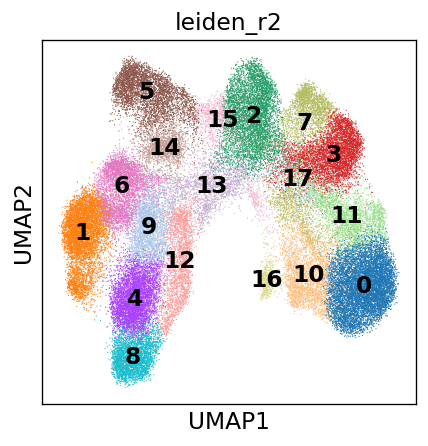

In [75]:
sc.pl.umap(adata, color='leiden_r2', legend_loc='on data')

In [76]:
pd.crosstab(adata.obs.dataset, adata.obs.leiden_r2)

leiden_r2,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
dataset,,,,,,,,,,,,,,,,,,
HCA,8698,5615,5528,4721,4862,4181,3976,3369,3331,2959,2900,2801,2445,1938,1974,1314,615,509
ALL,37,160,53,253,51,0,14,1,22,19,36,7,0,58,0,1,56,0


In [77]:
pd.crosstab(adata.obs.dataset, adata.obs.leiden_r2, normalize='index').round(2)

leiden_r2,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
dataset,,,,,,,,,,,,,,,,,,
HCA,0.14,0.09,0.09,0.08,0.08,0.07,0.06,0.05,0.05,0.05,0.05,0.05,0.04,0.03,0.03,0.02,0.01,0.01
ALL,0.05,0.21,0.07,0.33,0.07,0.00,0.02,0.00,0.03,0.02,0.05,0.01,0.00,0.08,0.00,0.00,0.07,0.00


In [78]:
pd.crosstab(adata.obs['sample'], adata.obs.leiden_r2)

leiden_r2,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
sample,,,,,,,,,,,,,,,,,,
D31,4,0,3,0,0,0,0,0,1,0,11,0,0,0,0,0,6,0
D33,3,3,2,0,0,0,1,0,0,0,2,0,0,1,0,0,14,0
D38,18,0,6,4,38,0,1,0,10,7,3,0,0,28,0,0,2,0
D39,1,0,5,7,3,0,0,0,3,5,0,1,0,0,0,0,4,0
D40,0,0,4,2,5,0,0,0,2,1,9,0,0,0,0,0,4,0
D42,3,108,13,107,1,0,8,0,4,5,3,2,0,17,0,1,2,0
I40,0,0,2,3,1,0,0,0,0,1,3,1,0,0,0,0,14,0
I42,8,49,18,130,3,0,4,1,2,0,5,3,0,12,0,0,10,0
MantonBM1,500,0,974,229,1427,1,4,3,367,767,307,147,41,218,0,1,98,11


In [79]:
pd.crosstab(adata.obs['sample'], adata.obs.leiden_r2, normalize='index').round(2)

leiden_r2,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
sample,,,,,,,,,,,,,,,,,,
D31,0.16,0.00,0.12,0.00,0.00,0.00,0.00,0.00,0.04,0.00,0.44,0.00,0.00,0.00,0.00,0.00,0.24,0.00
D33,0.12,0.12,0.08,0.00,0.00,0.00,0.04,0.00,0.00,0.00,0.08,0.00,0.00,0.04,0.00,0.00,0.54,0.00
D38,0.15,0.00,0.05,0.03,0.32,0.00,0.01,0.00,0.09,0.06,0.03,0.00,0.00,0.24,0.00,0.00,0.02,0.00
D39,0.03,0.00,0.17,0.24,0.10,0.00,0.00,0.00,0.10,0.17,0.00,0.03,0.00,0.00,0.00,0.00,0.14,0.00
D40,0.00,0.00,0.15,0.07,0.19,0.00,0.00,0.00,0.07,0.04,0.33,0.00,0.00,0.00,0.00,0.00,0.15,0.00
D42,0.01,0.39,0.05,0.39,0.00,0.00,0.03,0.00,0.01,0.02,0.01,0.01,0.00,0.06,0.00,0.00,0.01,0.00
I40,0.00,0.00,0.08,0.12,0.04,0.00,0.00,0.00,0.00,0.04,0.12,0.04,0.00,0.00,0.00,0.00,0.56,0.00
I42,0.03,0.20,0.07,0.53,0.01,0.00,0.02,0.00,0.01,0.00,0.02,0.01,0.00,0.05,0.00,0.00,0.04,0.00
MantonBM1,0.10,0.00,0.19,0.04,0.28,0.00,0.00,0.00,0.07,0.15,0.06,0.03,0.01,0.04,0.00,0.00,0.02,0.00


In [80]:
pd.crosstab(adata[~adata.obs['sample'].isin(['D42','I42'])].obs['dataset'], adata[~adata.obs['sample'].isin(['D42','I42'])].obs.leiden_r2)

leiden_r2,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
dataset,,,,,,,,,,,,,,,,,,
HCA,8698,5615,5528,4721,4862,4181,3976,3369,3331,2959,2900,2801,2445,1938,1974,1314,615,509
ALL,26,3,22,16,47,0,2,0,16,14,28,2,0,29,0,0,44,0


In [82]:
pd.crosstab(adata[~adata.obs['sample'].isin(['D42','I42'])].obs['dataset'], adata[~adata.obs['sample'].isin(['D42','I42'])].obs.leiden_r2, normalize='index')

leiden_r2,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
dataset,,,,,,,,,,,,,,,,,,
HCA,0.140890,0.090952,0.089543,0.076471,0.078755,0.067724,0.064403,0.054571,0.053956,0.047930,0.046974,0.045371,0.039604,0.031392,0.031975,0.021284,0.009962,0.008245
ALL,0.104418,0.012048,0.088353,0.064257,0.188755,0.000000,0.008032,0.000000,0.064257,0.056225,0.112450,0.008032,0.000000,0.116466,0.000000,0.000000,0.176707,0.000000


In [83]:
adata_subset = adata[(~adata.obs['sample'].isin(['D42','I40','I42'])) & adata.obs['leiden_r1'].isin(['0','2','4','7','8'])]

In [84]:
pd.crosstab(adata_subset.obs['dataset'], adata.obs['leiden_r2'])

leiden_r2,0,2,3,5,6,7,9,10,11,12,13,14,15,16,17
dataset,,,,,,,,,,,,,,,
HCA,8698,5527,4721,1,6,3368,23,2898,2801,14,1377,1,945,615,509
ALL,26,20,13,0,0,0,0,25,1,0,27,0,0,30,0


In [85]:
pd.crosstab(adata_subset.obs['dataset'], adata.obs['leiden_r2'], normalize='index').round(2)

leiden_r2,0,2,3,5,6,7,9,10,11,12,13,14,15,16,17
dataset,,,,,,,,,,,,,,,
HCA,0.28,0.18,0.15,0.0,0.0,0.11,0.0,0.09,0.09,0.0,0.04,0.0,0.03,0.02,0.02
ALL,0.18,0.14,0.09,0.0,0.0,0.00,0.0,0.18,0.01,0.0,0.19,0.0,0.00,0.21,0.00


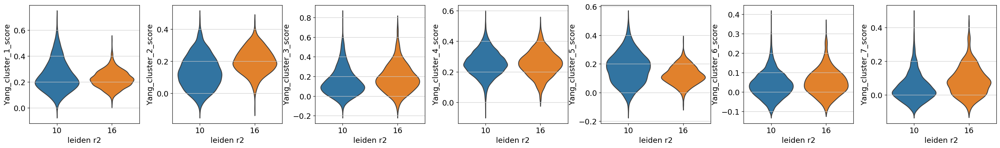

In [86]:
sc.pl.violin(adata[adata.obs.leiden_r2.isin(['10', '16'])], keys=['Yang_cluster_' + str(i) + '_score' for i in range(1,8)], stripplot=False, groupby='leiden_r2')

In [87]:
sc.tl.rank_genes_groups(adata, groupby='leiden_r2', use_raw=False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:26)


In [88]:
marker_genes_r2 = pd.Series()
for i in adata.obs.leiden_r2.cat.categories:
    marker_genes_r2 = marker_genes_r2.append(sc.get.rank_genes_groups_df(adata, group=i, pval_cutoff=1e-4, log2fc_min=2)['names'][:5])
marker_genes_r2 = marker_genes_r2.unique()

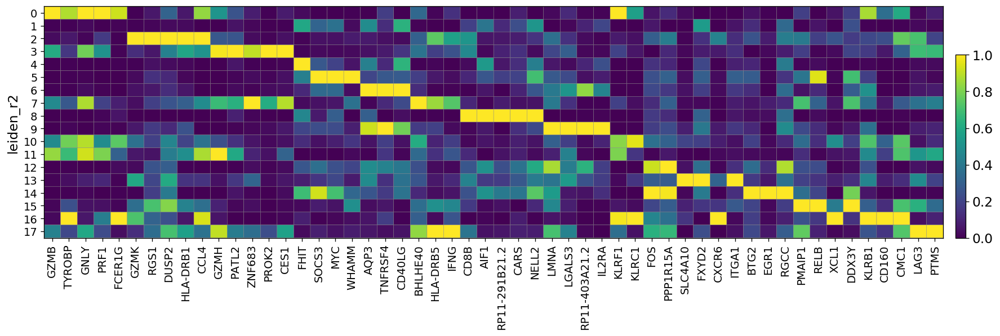

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[17.28, 0, 0.2])

In [89]:
sc.pl.matrixplot(adata, var_names=marker_genes_r2, groupby='leiden_r2', standard_scale='var')

In [90]:
marker_genes_r2_ver2 = pd.Series()
for i in ['0', '2', '3', '7', '10', '11', '16', '17']:
    marker_genes_r2_ver2 = marker_genes_r2_ver2.append(sc.get.rank_genes_groups_df(adata, group=i, pval_cutoff=1e-4, log2fc_min=2)['names'][:5])
marker_genes_r2_ver2 = marker_genes_r2_ver2.unique()

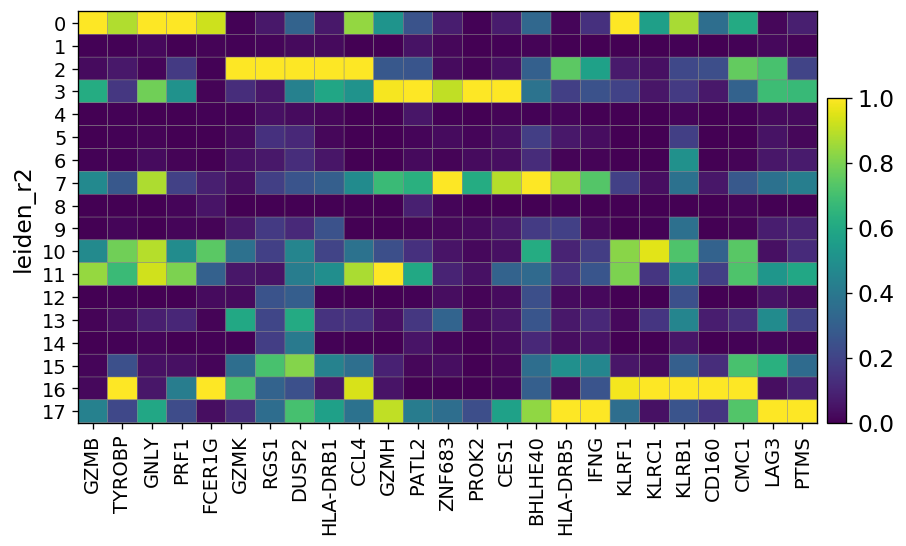

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[8.0, 0, 0.2])

In [91]:
sc.pl.matrixplot(adata, var_names=marker_genes_r2_ver2, groupby='leiden_r2', standard_scale='var')

In [92]:
marker_genes_r2_ver3 = pd.Series()
for i in ['0', '7', '10', '11', '16']:
    marker_genes_r2_ver3 = marker_genes_r2_ver3.append(sc.get.rank_genes_groups_df(adata, group=i, pval_cutoff=1e-4, log2fc_min=2)['names'][:5])
marker_genes_r2_ver3  = marker_genes_r2_ver3.unique()

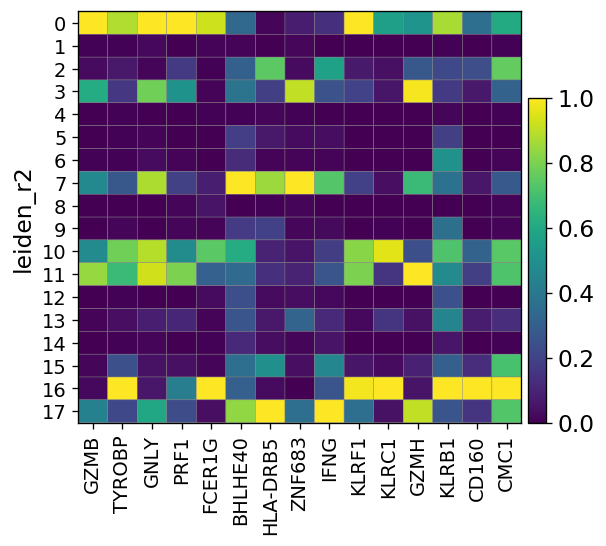

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[4.8, 0, 0.2])

In [93]:
sc.pl.matrixplot(adata, var_names=marker_genes_r2_ver3, groupby='leiden_r2', standard_scale='var')

In [94]:
def get_rank_genes_groups_df(cluster, adata):
    df = sc.get.rank_genes_groups_df(adata, group=cluster, pval_cutoff=1e-3)
    df['cluster'] = cluster
    return df

In [95]:
adata_subset_r2 = adata[adata.obs['leiden_r2'].isin(['0', '7', '10', '11', '16'])]

In [96]:
pd.crosstab(adata_subset_r2.obs['sample'], adata_subset_r2.obs['leiden_r2'])

leiden_r2,0,7,10,11,16
sample,,,,,
D31,4,0,11,0,6
D33,3,0,2,0,14
D38,18,0,3,0,2
D39,1,0,0,1,4
D40,0,0,9,0,4
D42,3,0,3,2,2
I40,0,0,3,1,14
I42,8,1,5,3,10
MantonBM1,500,3,307,147,98


In [97]:
sc.tl.rank_genes_groups(adata_subset_r2, groupby='leiden_r2', use_raw=False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)


In [98]:
df_r2 = pd.concat(list(map(get_rank_genes_groups_df, adata_subset_r2.obs.leiden_r2.cat.categories, adata_subset_r2)))

In [99]:
df_r2.groupby('cluster').head(3)

,scores,names,logfoldchanges,pvals,pvals_adj,cluster
0,84.630348,GZMB,1.276217,0.000000e+00,0.000000e+00,0
1,78.827919,PRF1,1.438130,0.000000e+00,0.000000e+00,0
2,76.628487,SPON2,1.905880,0.000000e+00,0.000000e+00,0
0,34.168758,CD3D,2.318676,6.283747e-233,3.377776e-230,7
1,34.089664,RPS4Y1,1.280624,4.155613e-235,2.330937e-232,7
2,32.884460,EIF1,0.342557,2.563334e-219,1.224799e-216,7
0,34.842060,SELL,2.291985,1.361082e-237,8.779661e-234,10
1,29.765526,GZMK,2.865344,1.103311e-176,1.779227e-173,10
2,26.782753,COTL1,2.354100,1.181689e-146,1.385906e-143,10
0,46.998837,GZMH,1.451272,0.000000e+00,0.000000e+00,11


In [100]:
for i in df_r2['cluster'].unique():
    gs = df_r2[df_r2['cluster'] == i]['names'][:20]
    sc.tl.score_genes(adata_subset_r2, gene_list=gs, score_name='HCA_ALL_NK_subset_cluster_' + str(i) + '_score')

computing score 'HCA_ALL_NK_subset_cluster_0_score'
    finished: added
    'HCA_ALL_NK_subset_cluster_0_score', score of gene set (adata.obs) (0:00:02)
computing score 'HCA_ALL_NK_subset_cluster_7_score'
    finished: added
    'HCA_ALL_NK_subset_cluster_7_score', score of gene set (adata.obs) (0:00:02)
computing score 'HCA_ALL_NK_subset_cluster_10_score'
    finished: added
    'HCA_ALL_NK_subset_cluster_10_score', score of gene set (adata.obs) (0:00:02)
computing score 'HCA_ALL_NK_subset_cluster_11_score'
    finished: added
    'HCA_ALL_NK_subset_cluster_11_score', score of gene set (adata.obs) (0:00:02)
computing score 'HCA_ALL_NK_subset_cluster_16_score'
    finished: added
    'HCA_ALL_NK_subset_cluster_16_score', score of gene set (adata.obs) (0:00:02)


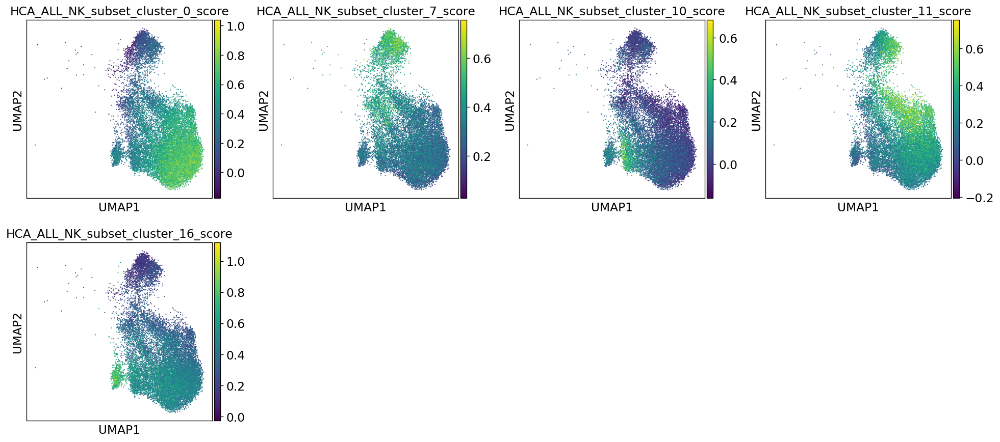

In [101]:
sc.pl.umap(adata_subset_r2, color=['HCA_ALL_NK_subset_cluster_' + str(i) + '_score' for i in df_r2['cluster'].unique()])

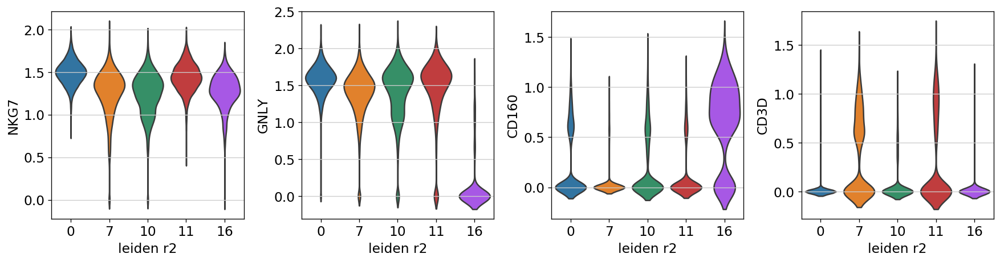

In [102]:
sc.pl.violin(adata_subset_r2, keys=['NKG7', 'GNLY', 'CD160', 'CD3D'], groupby='leiden_r2', stripplot=False)

In [103]:
for i in yang_genes_sorted['cluster'].unique():
    gs = yang_genes_sorted[yang_genes_sorted['cluster'] == i]['gene'][:20]
    sc.tl.score_genes(adata_subset_r2, gene_list=gs, score_name='Yang_cluster_' + str(i) + '_score')

computing score 'Yang_cluster_7_score'
    finished: added
    'Yang_cluster_7_score', score of gene set (adata.obs) (0:00:01)
computing score 'Yang_cluster_6_score'
    finished: added
    'Yang_cluster_6_score', score of gene set (adata.obs) (0:00:02)
computing score 'Yang_cluster_1_score'
    finished: added
    'Yang_cluster_1_score', score of gene set (adata.obs) (0:00:02)
computing score 'Yang_cluster_2_score'
    finished: added
    'Yang_cluster_2_score', score of gene set (adata.obs) (0:00:02)
computing score 'Yang_cluster_5_score'
    finished: added
    'Yang_cluster_5_score', score of gene set (adata.obs) (0:00:02)
computing score 'Yang_cluster_3_score'
    finished: added
    'Yang_cluster_3_score', score of gene set (adata.obs) (0:00:02)
computing score 'Yang_cluster_4_score'
    finished: added
    'Yang_cluster_4_score', score of gene set (adata.obs) (0:00:02)


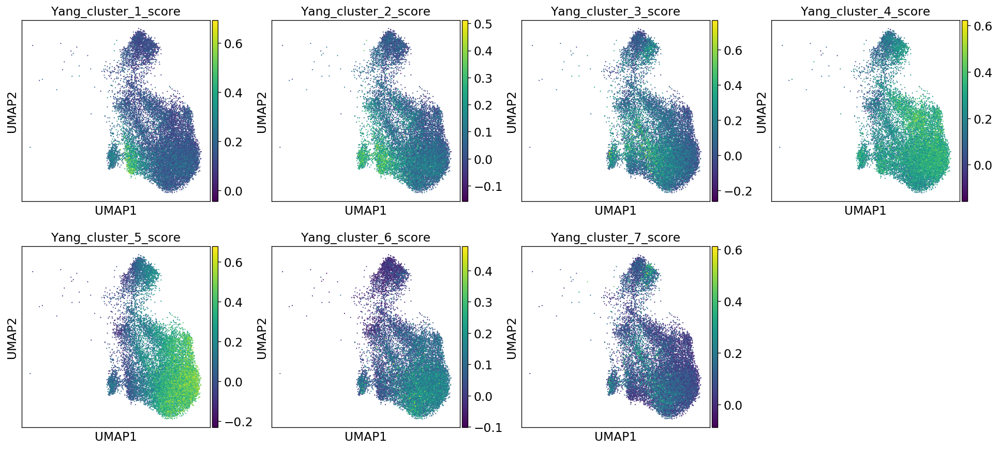

In [104]:
sc.pl.umap(adata_subset_r2, color=['Yang_cluster_' + str(i) + '_score' for i in range(1,8)])

In [105]:
adata_NK_subset = adata[adata.obs['leiden_r2'].isin(['0', '2', '3', '7', '10', '11', '16', '17'])]

In [106]:
sc.tl.rank_genes_groups(adata_NK_subset, groupby='leiden_r2', use_raw=False)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:06)


In [107]:
NK_df = pd.concat(list(map(get_rank_genes_groups_df, adata_NK_subset.obs.leiden_r2.cat.categories, adata_NK_subset)))

In [108]:
NK_df.groupby('cluster').head(3)

,scores,names,logfoldchanges,pvals,pvals_adj,cluster
0,107.960800,FCER1G,2.650901,0.000000e+00,0.000000e+00,0
1,107.336929,GZMB,1.757647,0.000000e+00,0.000000e+00,0
2,100.514847,TYROBP,1.853564,0.000000e+00,0.000000e+00,0
0,100.213554,GZMK,3.652699,0.000000e+00,0.000000e+00,2
1,77.309769,RGS1,3.416079,0.000000e+00,0.000000e+00,2
2,66.559502,CXCR4,1.378657,0.000000e+00,0.000000e+00,2
0,76.299728,CD52,1.627148,0.000000e+00,0.000000e+00,3
1,64.262299,CD3D,1.810184,0.000000e+00,0.000000e+00,3
2,57.371418,GZMH,1.345397,0.000000e+00,0.000000e+00,3
0,34.806789,RPS4Y1,1.325299,3.171133e-244,5.113848e-241,7


In [109]:
for i in NK_df['cluster'].unique():
    gs = NK_df[NK_df['cluster'] == i]['names'][:20]
    sc.tl.score_genes(adata_NK_subset, gene_list=gs, score_name='HCA_ALL_NK_subset_cluster_' + str(i) + '_score')

computing score 'HCA_ALL_NK_subset_cluster_0_score'
    finished: added
    'HCA_ALL_NK_subset_cluster_0_score', score of gene set (adata.obs) (0:00:03)
computing score 'HCA_ALL_NK_subset_cluster_2_score'
    finished: added
    'HCA_ALL_NK_subset_cluster_2_score', score of gene set (adata.obs) (0:00:03)
computing score 'HCA_ALL_NK_subset_cluster_3_score'
    finished: added
    'HCA_ALL_NK_subset_cluster_3_score', score of gene set (adata.obs) (0:00:03)
computing score 'HCA_ALL_NK_subset_cluster_7_score'
    finished: added
    'HCA_ALL_NK_subset_cluster_7_score', score of gene set (adata.obs) (0:00:03)
computing score 'HCA_ALL_NK_subset_cluster_10_score'
    finished: added
    'HCA_ALL_NK_subset_cluster_10_score', score of gene set (adata.obs) (0:00:03)
computing score 'HCA_ALL_NK_subset_cluster_11_score'
    finished: added
    'HCA_ALL_NK_subset_cluster_11_score', score of gene set (adata.obs) (0:00:03)
computing score 'HCA_ALL_NK_subset_cluster_16_score'
    finished: added
    '

In [110]:
adata_NK_subset.obs.leiden_r2.value_counts()

0     8735
2     5581
3     4974
7     3370
10    2936
11    2808
16     671
17     509
Name: leiden_r2, dtype: int64

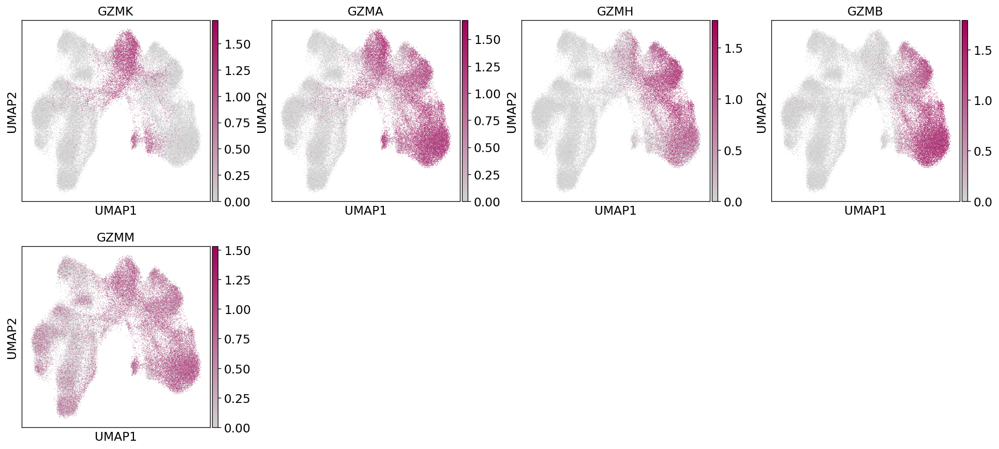

In [111]:
sc.pl.umap(adata, color=adata.var_names[adata.var_names.str.startswith('GZM')], color_map=cmap_gexp)

In [112]:
adata_subset_r2.obs['leiden_r2'].value_counts()

0     8735
7     3370
10    2936
11    2808
16     671
Name: leiden_r2, dtype: int64

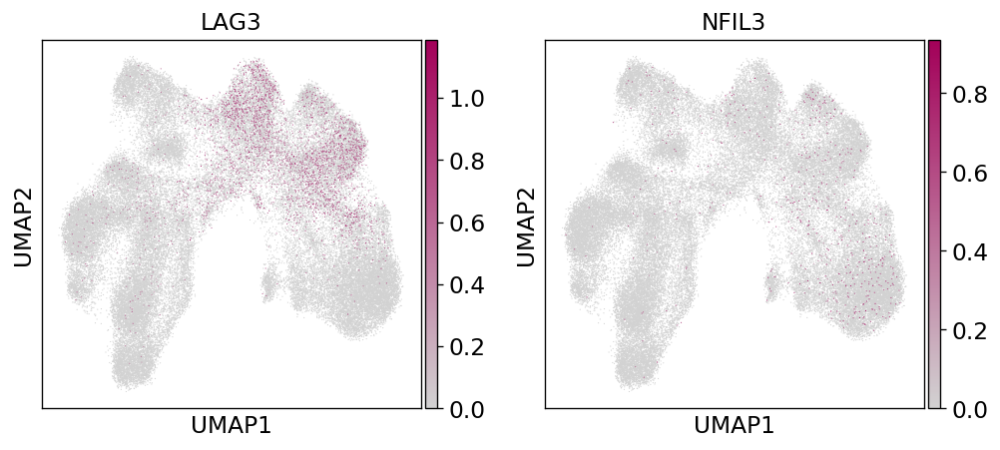

In [113]:
sc.pl.umap(adata, color=['LAG3', 'NFIL3'], color_map=cmap_gexp)

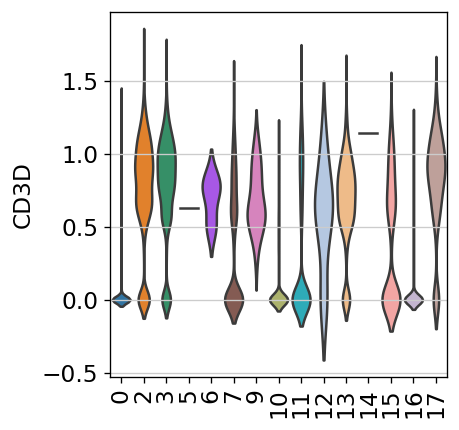

In [114]:
sc.pl.violin(adata_subset, keys='CD3D', stripplot=False, groupby='leiden_r2', rotation=90)

In [115]:
pd.crosstab(adata_subset[adata_subset.obs['leiden_r2'].isin(['0','7','10','11','16'])].obs['sample'], adata_subset[adata_subset.obs['leiden_r2'].isin(['0','7','10','11','16'])].obs['leiden_r2'])

leiden_r2,0,7,10,11,16
sample,,,,,
D31,4,0,11,0,6
D33,3,0,2,0,14
D38,18,0,3,0,2
D39,1,0,0,1,4
D40,0,0,9,0,4
MantonBM1,500,3,307,147,98
MantonBM2,4024,7,635,568,43
MantonBM3,15,3067,92,29,8
MantonBM4,2174,12,451,52,108


In [116]:
pd.crosstab(adata_subset[adata_subset.obs['leiden_r2'].isin(['0','7','10','11','16'])].obs['sample'], adata_subset[adata_subset.obs['leiden_r2'].isin(['0','7','10','11','16'])].obs['leiden_r2'], normalize='index').round(2)

leiden_r2,0,7,10,11,16
sample,,,,,
D31,0.19,0.00,0.52,0.00,0.29
D33,0.16,0.00,0.11,0.00,0.74
D38,0.78,0.00,0.13,0.00,0.09
D39,0.17,0.00,0.00,0.17,0.67
D40,0.00,0.00,0.69,0.00,0.31
MantonBM1,0.47,0.00,0.29,0.14,0.09
MantonBM2,0.76,0.00,0.12,0.11,0.01
MantonBM3,0.00,0.96,0.03,0.01,0.00
MantonBM4,0.78,0.00,0.16,0.02,0.04


In [117]:
pd.crosstab(adata_subset[adata_subset.obs['leiden_r2'].isin(['0','7','10','11','16'])].obs['sample'], adata_subset[adata_subset.obs['leiden_r2'].isin(['0','7','10','11','16'])].obs['leiden_r2'], normalize='columns').round(2)

leiden_r2,0,7,10,11,16
sample,,,,,
D31,0.00,0.00,0.00,0.00,0.01
D33,0.00,0.00,0.00,0.00,0.02
D38,0.00,0.00,0.00,0.00,0.00
D39,0.00,0.00,0.00,0.00,0.01
D40,0.00,0.00,0.00,0.00,0.01
MantonBM1,0.06,0.00,0.11,0.05,0.15
MantonBM2,0.46,0.00,0.22,0.20,0.07
MantonBM3,0.00,0.91,0.03,0.01,0.01
MantonBM4,0.25,0.00,0.15,0.02,0.17


In [118]:
#adata.write(results_file)